# Trying MLP and Naive bayes for our classification problem

In [1]:
import pandas as pd
import numpy as np

import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
#full_submission = pd.read_csv("Data/Kaggle/full_submission.csv")
#test_full = pd.read_csv("Data/Kaggle/test-full.csv")
#train_full = pd.read_csv('/content/train.csv')
train_full = pd.read_csv('datasets/train.csv')

In [3]:
train_full.head(3)

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,242642,2881,130,22,210,54,1020,250,221,88,...,0,0,0,0,0,0,0,0,0,1
1,309891,3005,351,14,242,-16,1371,194,215,159,...,0,0,0,0,0,0,0,0,0,1
2,287847,3226,63,14,618,2,1092,232,210,107,...,0,0,0,0,0,0,0,0,0,1


In [4]:
train_full.dtypes

Id                                    int64
Elevation                             int64
Aspect                                int64
Slope                                 int64
Horizontal_Distance_To_Hydrology      int64
Vertical_Distance_To_Hydrology        int64
Horizontal_Distance_To_Roadways       int64
Hillshade_9am                         int64
Hillshade_Noon                        int64
Hillshade_3pm                         int64
Horizontal_Distance_To_Fire_Points    int64
Wilderness_Area1                      int64
Wilderness_Area2                      int64
Wilderness_Area3                      int64
Wilderness_Area4                      int64
Soil_Type1                            int64
Soil_Type2                            int64
Soil_Type3                            int64
Soil_Type4                            int64
Soil_Type5                            int64
Soil_Type6                            int64
Soil_Type7                            int64
Soil_Type8                      

In [5]:
train_full.describe()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
count,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,...,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000,15120.000000
mean,267008.526389,2748.649934,155.834524,16.556746,228.376521,51.311706,1717.977712,213.028836,218.865741,134.477116,...,0.043849,0.040939,0.001190,0.006812,0.000926,0.002116,0.049206,0.041931,0.030159,4.000000
std,179261.722330,419.009589,109.745372,8.534602,209.196381,61.520488,1330.263450,30.638406,22.797288,46.070054,...,0.204766,0.198156,0.034484,0.082257,0.030416,0.045957,0.216306,0.200439,0.171030,2.000066
min,5.000000,1877.000000,0.000000,0.000000,0.000000,-135.000000,0.000000,52.000000,99.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,103705.000000,2373.000000,65.000000,10.000000,67.000000,5.000000,760.000000,197.000000,207.000000,106.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000
50%,276034.500000,2754.000000,125.000000,15.000000,180.000000,32.000000,1315.000000,220.000000,223.000000,138.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000
75%,398150.250000,3109.000000,257.000000,22.000000,330.000000,80.000000,2292.000000,236.000000,235.000000,166.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000
max,581005.000000,3850.000000,360.000000,50.000000,1376.000000,570.000000,6803.000000,254.000000,254.000000,251.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,7.000000


In [6]:
from ydata_profiling import ProfileReport

ProfileReport(train_full).to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [7]:
import xgboost
from xgboost import XGBClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)


# Function for comparing different approaches
def score_dataset(data):
    y = data['Cover_Type'] - 1 # <- Target
    X = data.drop(columns=['Cover_Type'])
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.80, random_state=42)

    clf = XGBClassifier(n_jobs=-1, n_estimators=50, random_state=1)
    clf.fit(X=X_train, y=y_train)

    pred = clf.predict(X_train)
    acc_train = round(accuracy_score(y_train, pred),4)

    pred = clf.predict(X_val)
    acc_test = round(accuracy_score(y_val, pred),4)

    return acc_train, acc_test


# Function for comparing different approaches
def model_plt(data):
    y = data['Cover_Type'] - 1 # <- Target
    X = data.drop(columns=['Cover_Type'])
    scaler = StandardScaler()
    X = scaler.fit_transform(X)

    X_train, X_val, y_train, y_val = train_test_split(X, y, train_size=0.80, random_state=42)

    clf = XGBClassifier(n_jobs=-1, n_estimators=50, random_state=1)
    clf.fit(X=X_train, y=y_train)

    return clf

In [8]:
dummy_target = pd.get_dummies(train_full['Cover_Type'], prefix='Cover_Type', dtype=int)

In [9]:
dummy_target

,Cover_Type_1,Cover_Type_2,Cover_Type_3,Cover_Type_4,Cover_Type_5,Cover_Type_6,Cover_Type_7
0,1,0,0,0,0,0,0
1,1,0,0,0,0,0,0
2,1,0,0,0,0,0,0
3,1,0,0,0,0,0,0
4,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...
15115,0,0,0,0,0,0,1
15116,0,0,0,0,0,0,1
15117,0,0,0,0,0,0,1
15118,0,0,0,0,0,0,1


In [10]:
train_full = train_full.merge(dummy_target, right_index=True, left_index=True)#.drop(columns=['Cover_Type'])

In [11]:
train_full

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,Soil_Type39,Soil_Type40,Cover_Type,Cover_Type_1,Cover_Type_2,Cover_Type_3,Cover_Type_4,Cover_Type_5,Cover_Type_6,Cover_Type_7
0,242642,2881,130,22,210,54,1020,250,221,88,...,0,0,1,1,0,0,0,0,0,0
1,309891,3005,351,14,242,-16,1371,194,215,159,...,0,0,1,1,0,0,0,0,0,0
2,287847,3226,63,14,618,2,1092,232,210,107,...,0,0,1,1,0,0,0,0,0,0
3,516307,3298,317,8,661,60,752,198,233,174,...,0,0,1,1,0,0,0,0,0,0
4,124860,3080,35,6,175,26,3705,219,227,144,...,0,0,1,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,475155,3328,321,13,323,12,5109,186,227,180,...,0,0,7,0,0,0,0,0,0,1
15116,514378,3455,37,5,841,92,939,220,229,146,...,0,1,7,0,0,0,0,0,0,1
15117,368425,3279,90,14,404,113,1513,240,218,105,...,0,0,7,0,0,0,0,0,0,1
15118,537844,3589,357,9,418,52,1868,205,223,155,...,0,1,7,0,0,0,0,0,0,1


# Hydrology Engineering

In [12]:
train_full.loc[:, 'Euclidian_Distance'] = np.sqrt((train_full['Vertical_Distance_To_Hydrology'] ** 2) + (train_full['Horizontal_Distance_To_Hydrology'] ** 2))
train_full.loc[:, 'Hydrology_Ratio'] = train_full['Vertical_Distance_To_Hydrology'] / train_full['Horizontal_Distance_To_Hydrology']
train_full.loc[:, 'Hydrology_Ratio'].fillna(0, inplace=True)
# IDEA: "Horizontal_Distance_To_Hydrology" and "Vertical_Distance_To_Hydrology" are highly correlated --> Euclidean distance to hydrology.
# PRACTICE: Doesnt really seem to make sense

# Hillshade Enginnering

In [13]:
import numpy as np

# Calculate mean Hillshade
def calculate_mean_hillshade(df):
    df['Mean_Hillshade'] = df[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].mean(axis=1)
    return df

# Calculate median Hillshade
def calculate_median_hillshade(df):
    df['Median_Hillshade'] = df[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].median(axis=1)
    return df

# Calculate standard deviation of Hillshade
def calculate_std_hillshade(df):
    df['Std_Hillshade'] = df[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].std(axis=1)
    return df

# Calculate range of Hillshade
def calculate_range_hillshade(df):
    df['Range_Hillshade'] = df[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].max(axis=1) - df[['Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm']].min(axis=1)
    return df

# Calculate differences between Hillshade indices
def calculate_hillshade_differences(df):
    df['Diff_9am_Noon'] = df['Hillshade_9am'] - df['Hillshade_Noon']
    df['Diff_Noon_3pm'] = df['Hillshade_Noon'] - df['Hillshade_3pm']
    df['Diff_9am_3pm'] = df['Hillshade_9am'] - df['Hillshade_3pm']
    return df


def categorize_aspect(aspect):
    if 0 <= aspect <= 180:
        return 1
    elif 180 < aspect <= 360:
        return -1


#Bin Aspect 0-180, 180-360
def Bin_Aspect(df):
    df['Binned_Aspect']=df['Aspect'].apply(categorize_aspect)
    return df

#Calculate Slope times aspect binned1 or -1 for each direction in respect to sunset and sunrising
def Calculate_Slope_Aspect(df):
    df['Slope_Aspect'] = df['Slope'] * df['Binned_Aspect']
    return df

def Calculate_Hillshade_Slope_Aspect(df):
    df['Hillshade_3_9_Slope_Aspect'] = df['Hillshade_3pm']*df['Slope_Aspect']+df['Hillshade_9am']*df['Slope_Aspect']
    df['Hillshade_Noon_Slope_Aspect']= df['Hillshade_Noon']*df['Slope_Aspect']
    return df

def Calculate_Hillshade_Slope(df):
    df['Hillshade_3_9_Slope'] = df['Hillshade_3pm']*df['Slope']+df['Hillshade_9am']*df['Slope']
    df['Hillshade_Noon_Slope']= df['Hillshade_Noon']*df['Slope']
    return df




train_full = calculate_mean_hillshade(train_full)
train_full = calculate_median_hillshade(train_full)
train_full = calculate_std_hillshade(train_full)
train_full = calculate_range_hillshade(train_full)
train_full = calculate_hillshade_differences(train_full)
train_full = Bin_Aspect(train_full)
train_full = Calculate_Slope_Aspect(train_full)
train_full = Calculate_Hillshade_Slope_Aspect(train_full)
train_full =Calculate_Hillshade_Slope(train_full)



# Soiltype Engineering

In [14]:
"""
First digit: climatic zone

1: lower montane dry: -
2: lower montane: 1-6
3: montane dry: 7, 8
4: montane: 9-13
5: montane dry and montane: 14, 15 # Should we add these two two the two previous ones each ?
6: montane and subalpine: 16-18
7: subalpine: 19-34
8: alpine: 35-40
Second digit: geologic zones

1: alluvium: 14-17, 19-21
2: glacial: 9, 22, 23
3: shale: -
4: sandstone: -
5: mixed sedimentary: 7, 8
6: unspecified in the USFS ELU Survey: -
7: igneous and metamorphic: 1-6, 10-13, 18, 24-40
8: volcanic: -


The third and fourth ELU digits are unique to the mapping unit and have no special meaning to the climatic or geologic zones.

"""

'\nFirst digit: climatic zone\n\n1: lower montane dry: -\n2: lower montane: 1-6\n3: montane dry: 7, 8\n4: montane: 9-13\n5: montane dry and montane: 14, 15 # Should we add these two two the two previous ones each ?\n6: montane and subalpine: 16-18\n7: subalpine: 19-34\n8: alpine: 35-40\nSecond digit: geologic zones\n\n1: alluvium: 14-17, 19-21\n2: glacial: 9, 22, 23\n3: shale: -\n4: sandstone: -\n5: mixed sedimentary: 7, 8\n6: unspecified in the USFS ELU Survey: -\n7: igneous and metamorphic: 1-6, 10-13, 18, 24-40\n8: volcanic: -\n\n\nThe third and fourth ELU digits are unique to the mapping unit and have no special meaning to the climatic or geologic zones.\n\n'

In [15]:
# First digit: climatic zone
train_full.loc[:, 'lower_montane'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (1, 7)))]].sum(axis=1)
train_full.loc[:, 'montane_dry'] = train_full.loc[:, [col for col in train_full if col.endswith(('Type7', 'Type8'))]].sum(axis=1)
train_full.loc[:, 'montane'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (9, 14)))]].sum(axis=1)
train_full.loc[:, 'montane_dry_and_montane'] = train_full.loc[:, [col for col in train_full if col.endswith(('Type14', 'Type15'))]].sum(axis=1)
train_full.loc[:, 'montane_and_subalpine'] = train_full.loc[:, [col for col in train_full if col.endswith(('Type16', 'Type17', 'Type18'))]].sum(axis=1)
train_full.loc[:, 'subalpine'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (19, 35)))]].sum(axis=1)
train_full.loc[:, 'alpine'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (35, 41)))]].sum(axis=1)


In [16]:
# Second digit: geologic zones

train_full.loc[:, 'alluvium'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (14, 8)) + tuple(f'Type{i}' for i in range (19, 21)))]].sum(axis=1)
train_full.loc[:, 'glacial'] = train_full.loc[:, [col for col in train_full if col.endswith(('Type9', 'Type22', 'Type23'))]].sum(axis=1)
train_full.loc[:, 'mixed_sedimentary'] = train_full.loc[:, [col for col in train_full if col.endswith(('Type7', 'Type8'))]].sum(axis=1)
train_full.loc[:, 'igneous_and_metamorphic'] = train_full.loc[:, [col for col in train_full if col.endswith(tuple(f'Type{i}' for i in range (1, 7)) + tuple(f'Type{i}' for i in range (10, 14)) + tuple(['Type18']) + tuple(f'Type{i}' for i in range (24, 41)))]].sum(axis=1)


In [17]:
#One vector for all Soiltype
Soiltype_list=[]

for i in range(1,41):
    Soiltype_list.append('Soil_Type'+str(i))

train_full['Soil_type'] = train_full[Soiltype_list].apply(lambda x: (list(x).index(1)+1), axis=1)

# Aspect Enginnering

In [18]:

# Define the bin edges for each sector (in degrees)
bin_edges = [0,  22.5,  67.5, 112.5, 157.5, 202.5, 247.5, 292.5, 337.5, 360]

# Define labels for each sector
bin_labels = ['N1', 'NE', 'E', 'SE', 'S', 'SW', 'W', 'NW', 'N2']

# Create a new column 'Aspect_Sector' to store the discretized aspect
train_full['Aspect_Sector'] = pd.cut(train_full['Aspect'], bins=bin_edges, labels=bin_labels, include_lowest=True)

# Replace 'N1' and 'N2' labels with 'N'
train_full['Aspect_Sector'].replace({'N1': 'N', 'N2': 'N'}, inplace=True)

# If you want to convert the 'Aspect_Sector' column to categorical type
train_full['Aspect_Sector'] = train_full['Aspect_Sector'].astype('category')

# Display the first few rows of the DataFrame to verify the changes
print(train_full[['Aspect', 'Aspect_Sector']].head())



   Aspect Aspect_Sector
0     130            SE
1     351             N
2      63            NE
3     317            NW
4      35            NE


In [19]:
dummy_aspect = pd.get_dummies(train_full['Aspect_Sector'], prefix='Aspect_Sector', dtype=int)
train_full = train_full.merge(dummy_aspect, right_index=True, left_index=True)

# Basic EDA

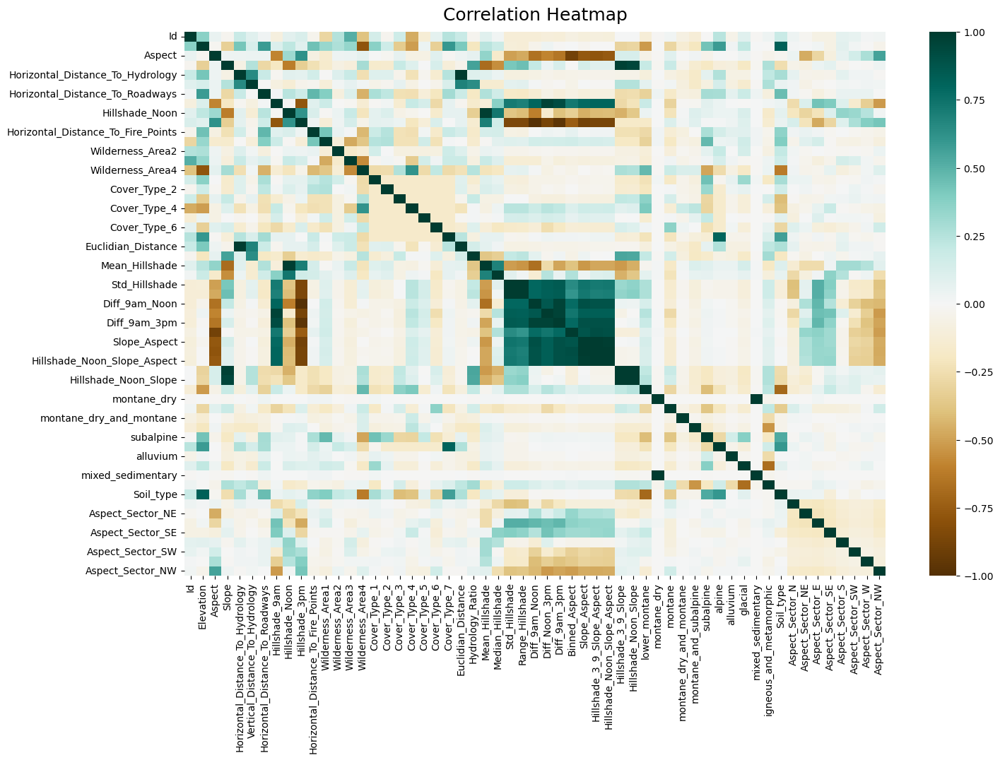

In [20]:
%matplotlib inline

train_limited = train_full.loc[:, [col for col in train_full if not col.startswith('Soil_Type')]]

plt.figure(figsize=(16, 10))
heatmap = sns.heatmap(train_limited.drop(columns=['Cover_Type', 'Aspect_Sector']).corr(), vmin=-1, vmax=1, cmap='BrBG')
heatmap.set_title('Correlation Heatmap', fontdict={'fontsize':18}, pad=12);
# save heatmap as .png file
# dpi - sets the resolution of the saved image in dots/inches
# bbox_inches - when set to 'tight' - does not allow the labels to be cropped
plt.savefig('heatmap.png', dpi=300, bbox_inches='tight')

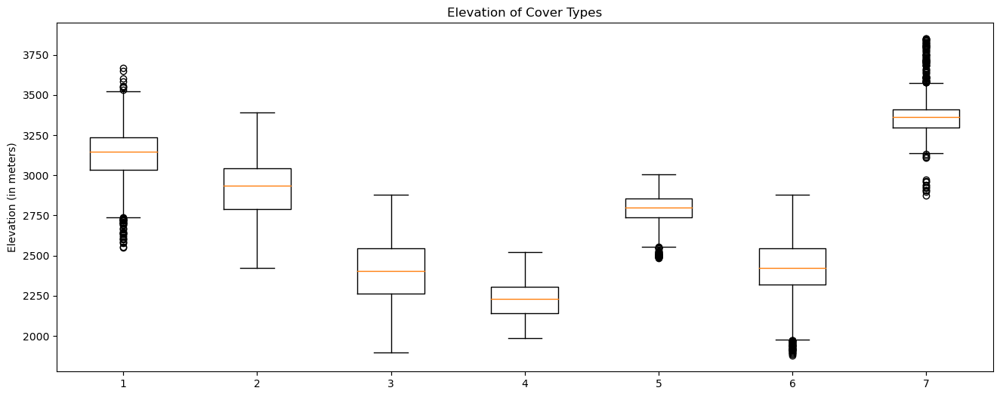

In [21]:
spruce = train_full[train_full.Cover_Type == 1]
lodgepole = train_full[train_full.Cover_Type == 2]
ponderosa = train_full[train_full.Cover_Type == 3]
willow = train_full[train_full.Cover_Type == 4]
aspen = train_full[train_full.Cover_Type == 5]
douglas = train_full[train_full.Cover_Type == 6]
krummholz = train_full[train_full.Cover_Type == 7]
plt.figure(figsize=(16, 6))
plt.title('Elevation of Cover Types')
plt.ylabel('Elevation (in meters)')
data = [spruce.Elevation, lodgepole.Elevation, ponderosa.Elevation, willow.Elevation,
aspen.Elevation, douglas.Elevation, krummholz.Elevation]
plt.xticks([1, 2, 3, 4, 5, 6, 7])
plt.boxplot(data)
plt.show()

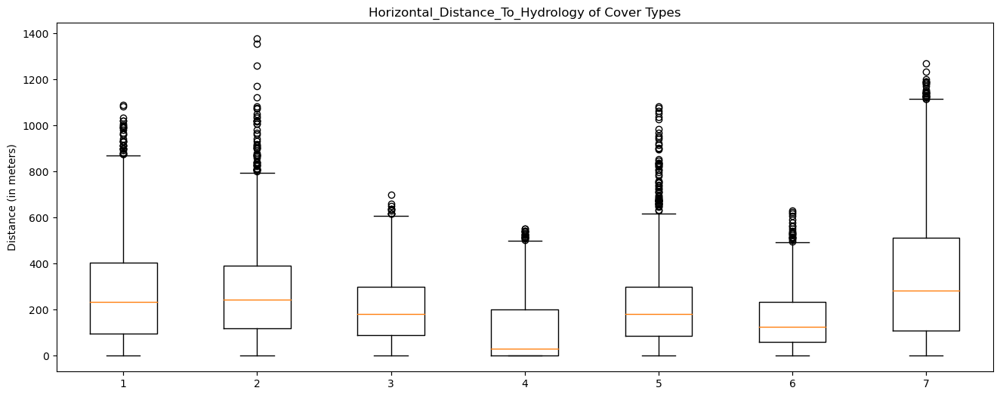

In [22]:
plt.figure(figsize=(16, 6))
plt.title('Horizontal_Distance_To_Hydrology of Cover Types')
plt.ylabel('Distance (in meters)')
data = [spruce.Horizontal_Distance_To_Hydrology, lodgepole.Horizontal_Distance_To_Hydrology,
        ponderosa.Horizontal_Distance_To_Hydrology, willow.Horizontal_Distance_To_Hydrology,
        aspen.Horizontal_Distance_To_Hydrology, douglas.Horizontal_Distance_To_Hydrology,
        krummholz.Horizontal_Distance_To_Hydrology]
plt.xticks([1, 2, 3, 4, 5, 6, 7])
plt.boxplot(data)
plt.show()

# All the tree types love their water. The order is a little different from the elevation order. The pines that grow higher up can handle a bit more horizontal distance from the water. The maxima emphasize the distinction.



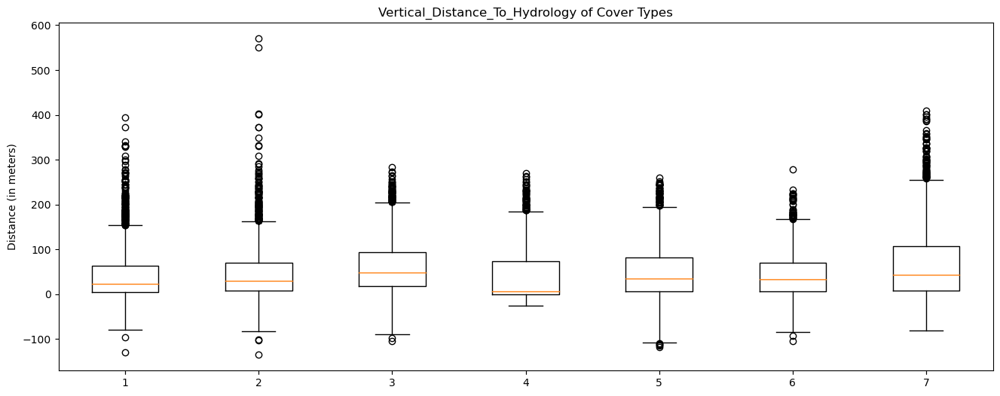

In [23]:
plt.figure(figsize=(16, 6))
plt.title('Vertical_Distance_To_Hydrology of Cover Types')
plt.ylabel('Distance (in meters)')
data = [spruce.Vertical_Distance_To_Hydrology, lodgepole.Vertical_Distance_To_Hydrology,
        ponderosa.Vertical_Distance_To_Hydrology, willow.Vertical_Distance_To_Hydrology,
        aspen.Vertical_Distance_To_Hydrology, douglas.Vertical_Distance_To_Hydrology,
        krummholz.Vertical_Distance_To_Hydrology]
plt.xticks([1, 2, 3, 4, 5, 6, 7])
plt.boxplot(data)
plt.show()

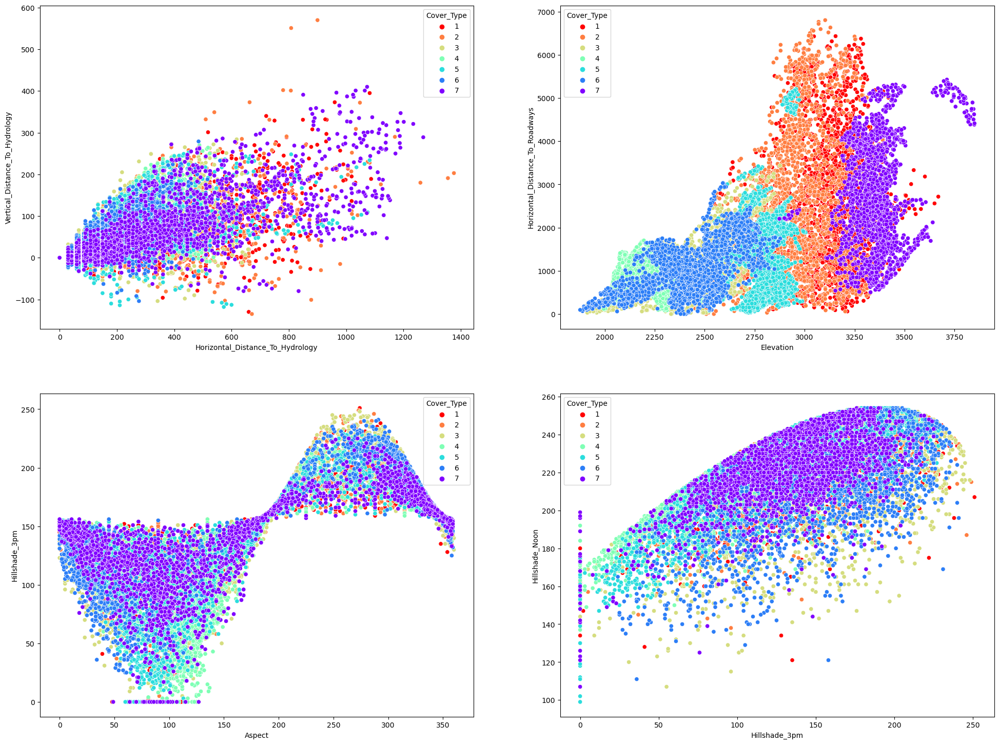

In [24]:
import warnings
warnings.filterwarnings('ignore', category=FutureWarning)
fig, ax = plt.subplots(2,2, figsize=(24,18))

sns.scatterplot(data=train_full, x="Horizontal_Distance_To_Hydrology", y="Vertical_Distance_To_Hydrology", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[0,0])
sns.scatterplot(data=train_full, x="Elevation", y="Horizontal_Distance_To_Roadways", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[0,1])
sns.scatterplot(data=train_full, x="Aspect", y="Hillshade_3pm", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[1,0])
sns.scatterplot(data=train_full, x="Hillshade_3pm", y="Hillshade_Noon", hue="Cover_Type", legend='full', palette='rainbow_r', ax=ax[1,1])
plt.show()

# Scoring

In [25]:
train_scoring = train_full.loc[:, [col for col in train_full if not col.startswith('Cover_Type_')]]
#train_scoring = train_scoring.loc[:, [col for col in train_scoring if not col.startswith('Soil_Type')]]

train_scoring.drop(columns=['Aspect_Sector'],  inplace=True)#


In [26]:
# IMPACT: HYDROLOGY
base_hydro_data = train_scoring.drop(columns=['Euclidian_Distance', 'Hydrology_Ratio'])
changed_hydro_data = train_scoring.drop(columns=['Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology'])

base_hydro = score_dataset(base_hydro_data)
changed_hydro = score_dataset(changed_hydro_data)

# IMPACT: HILLSHADE
base_hillshade_data = train_scoring.drop(columns=['Mean_Hillshade',
       'Median_Hillshade', 'Std_Hillshade', 'Range_Hillshade', 'Diff_9am_Noon',
       'Diff_Noon_3pm', 'Diff_9am_3pm'])

changed_hillshade_data = train_scoring.drop(columns=['Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm'])

base_hillshade = score_dataset(base_hillshade_data)
changed_hillshade = score_dataset(changed_hillshade_data)


In [27]:
print(base_hydro)
print(changed_hydro)

print(base_hillshade)
print(changed_hillshade)

(0.9669, 0.8657)
(0.963, 0.8674)
(0.9636, 0.8647)
(0.9647, 0.8707)


<BarContainer object of 10 artists>

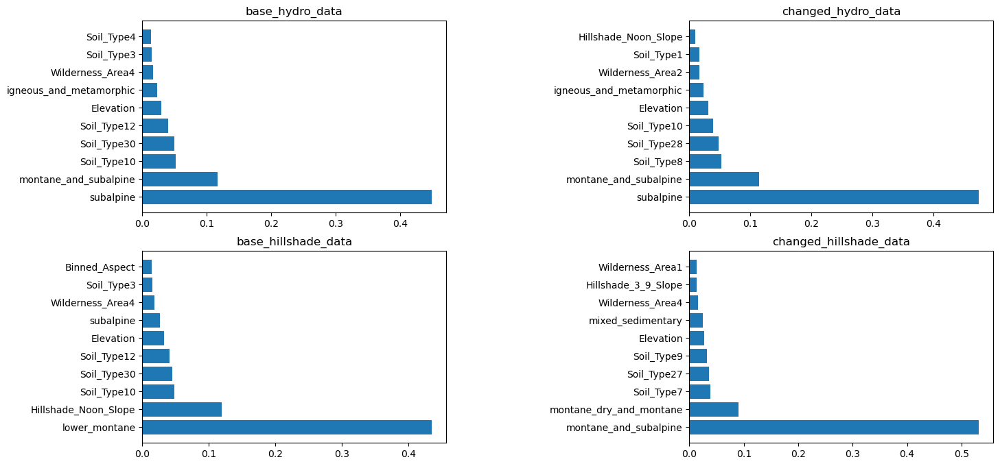

In [28]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 8))
fig.subplots_adjust(wspace=0.8)

model = model_plt(base_hydro_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax1.title.set_text('base_hydro_data')
ax1.barh(base_hydro_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

model = model_plt(changed_hydro_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax2.title.set_text('changed_hydro_data')
ax2.barh(base_hydro_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])


model = model_plt(base_hillshade_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax3.title.set_text('base_hillshade_data')
ax3.barh(base_hydro_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

model = model_plt(changed_hillshade_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax4.title.set_text('changed_hillshade_data')
ax4.barh(base_hydro_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

In [29]:
# IMPACT: SOILTYPE

soil_types = train_full.loc[:, [col for col in train_full if col.startswith('Soil_Type')]]
soil_data = train_scoring.merge(soil_types, right_index=True, left_index=True)
soil_data = train_scoring.copy()

base_soil_data = soil_data.drop(columns=['lower_montane', 'montane_dry',
       'montane', 'montane_dry_and_montane', 'montane_and_subalpine',
       'subalpine', 'alpine', 'alluvium', 'glacial', 'mixed_sedimentary',
       'igneous_and_metamorphic'])
changed_soil_data = soil_data.drop(columns=[col for col in train_full if col.startswith('Soil_Type')])

base_soil = score_dataset(base_soil_data)
changed_soil = score_dataset(changed_soil_data)

# IMPACT: ASPECT

base_aspect_data = train_scoring.drop(columns=[col for col in train_full if col.startswith('Aspect_Sector_')])
changed_aspect_data = train_scoring.drop(columns=['Aspect'])

base_aspect = score_dataset(base_aspect_data)
changed_aspect = score_dataset(changed_aspect_data)


In [30]:
print(base_soil)
print(changed_soil)

print(base_aspect)
print(changed_aspect)

(0.9683, 0.8684)
(0.9702, 0.8674)
(0.964, 0.8684)
(0.9634, 0.8704)


<BarContainer object of 10 artists>

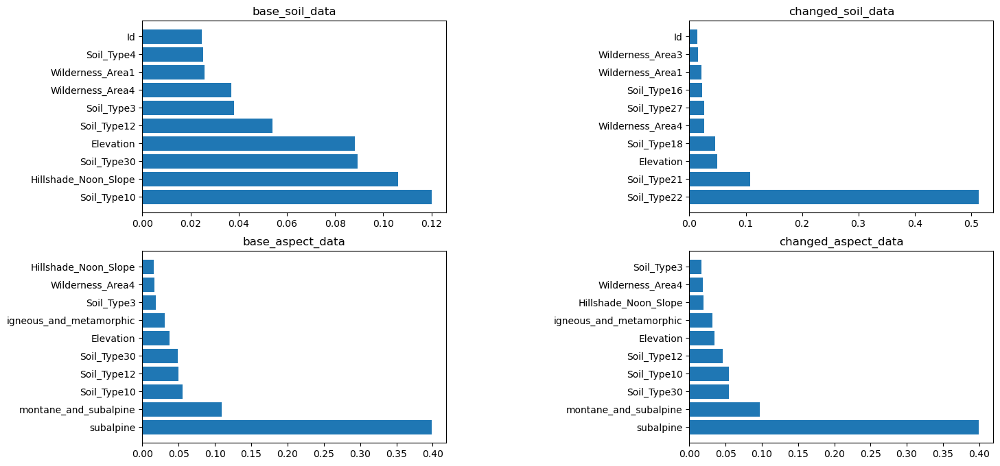

In [31]:
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2, figsize=(16, 8))
fig.subplots_adjust(wspace=.8)

model = model_plt(base_soil_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax1.title.set_text('base_soil_data')
ax1.barh(base_soil_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

model = model_plt(changed_soil_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax2.title.set_text('changed_soil_data')
ax2.barh(base_soil_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])


model = model_plt(base_aspect_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax3.title.set_text('base_aspect_data')
ax3.barh(base_aspect_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

model = model_plt(changed_aspect_data)
sorted_idx = model.feature_importances_.argsort()[::-1]
ax4.title.set_text('changed_aspect_data')
ax4.barh(changed_aspect_data.columns[sorted_idx][:10], model.feature_importances_[sorted_idx][:10 ])

In [32]:
score_dataset(train_scoring)

(0.9659, 0.8641)

<BarContainer object of 15 artists>

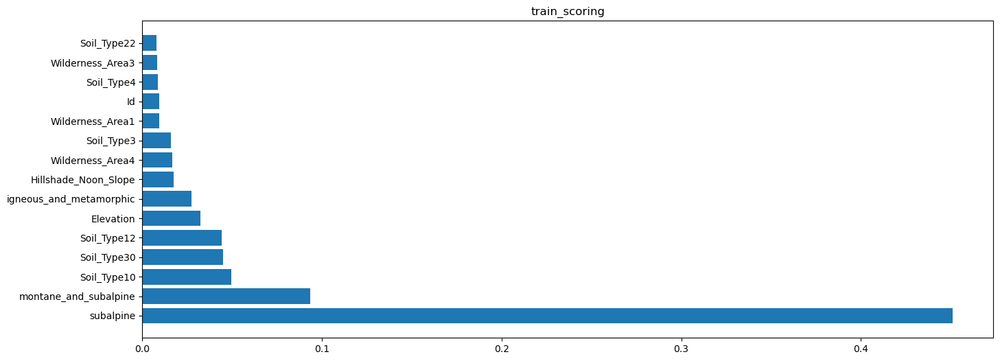

In [33]:
plt.figure(figsize=(16, 6))
model = model_plt(train_scoring)
sorted_idx = model.feature_importances_.argsort()[::-1]
plt.title('train_scoring')
plt.barh(train_scoring.columns[sorted_idx][:15], model.feature_importances_[sorted_idx][:15])

In [34]:
train_scoring

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,igneous_and_metamorphic,Soil_type,Aspect_Sector_N,Aspect_Sector_NE,Aspect_Sector_E,Aspect_Sector_SE,Aspect_Sector_S,Aspect_Sector_SW,Aspect_Sector_W,Aspect_Sector_NW
0,242642,2881,130,22,210,54,1020,250,221,88,...,1,30,0,0,0,1,0,0,0,0
1,309891,3005,351,14,242,-16,1371,194,215,159,...,1,24,1,0,0,0,0,0,0,0
2,287847,3226,63,14,618,2,1092,232,210,107,...,1,29,0,1,0,0,0,0,0,0
3,516307,3298,317,8,661,60,752,198,233,174,...,0,23,0,0,0,0,0,0,0,1
4,124860,3080,35,6,175,26,3705,219,227,144,...,1,24,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,475155,3328,321,13,323,12,5109,186,227,180,...,1,38,0,0,0,0,0,0,0,1
15116,514378,3455,37,5,841,92,939,220,229,146,...,1,40,0,1,0,0,0,0,0,0
15117,368425,3279,90,14,404,113,1513,240,218,105,...,1,29,0,0,1,0,0,0,0,0
15118,537844,3589,357,9,418,52,1868,205,223,155,...,1,40,1,0,0,0,0,0,0,0


In [35]:
y = train_scoring['Cover_Type'] - 1
X = train_scoring.drop(columns=['Cover_Type'])

# Model Selection

In [36]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
import statsmodels.api as sm


# Step 1: Split the data into training and validation sets
X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 2: Initialize selected features with an empty list
selected_features = list(X.columns)
selected_features_new = selected_features.copy()

# Step 3: Perform bidirectional selection based on AIC
while True:
    # Forward step: Add the best feature
    best_feature = None
    best_aic = np.inf
    for feature in X_train.columns:

        if feature not in selected_features:
            features_subset = selected_features + [feature]
            model = XGBClassifier(n_jobs=-1, n_estimators=50, random_state=1)
            model.fit(X_train[features_subset], y_train)
            y_pred = model.predict(X_val[features_subset])
            accuracy = accuracy_score(y_val, y_pred)
            n = len(y_train)
            k = len(features_subset)
            deviance = -2 * accuracy_score(y_val, y_pred) * n
            aic = deviance + 2 * k
            if aic < best_aic:
                best_aic = aic
                best_feature = feature

    # Backward step: Remove the worst feature
    if best_feature is not None:
        selected_features_new.append(best_feature)

    # Check if removing any feature would improve AIC
    worst_feature = None
    worst_aic = best_aic

    for feature in selected_features:

        features_subset = selected_features.copy()
        features_subset.remove(feature)
        model = XGBClassifier(n_jobs=-1, n_estimators=50, random_state=1)
        model.fit(X_train[features_subset], y_train)
        y_pred = model.predict(X_val[features_subset])
        accuracy = accuracy_score(y_val, y_pred)
        n = len(y_train)
        k = len(features_subset)
        deviance = -2 * accuracy_score(y_val, y_pred) * n
        aic = deviance + 2 * k
        if aic < worst_aic:
            worst_aic = aic
            worst_feature = feature

    # Remove the worst feature if it improves AIC
    if worst_feature is not None:
        selected_features_new.remove(worst_feature)

    if selected_features == selected_features_new:
        break
    else:
        selected_features = selected_features_new

    print(selected_features)


['Id', 'Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_Type40', 'Hydrology_Ratio', 'Mean_Hillshade', 'Median_Hillshade', 'Std_Hillshade', 'Range_Hillshade', 'D

In [37]:
features_not_kept = set(X.columns) - set(selected_features)
print("Features not kept using AIC:", features_not_kept)

Features not kept using AIC: {'Euclidian_Distance'}


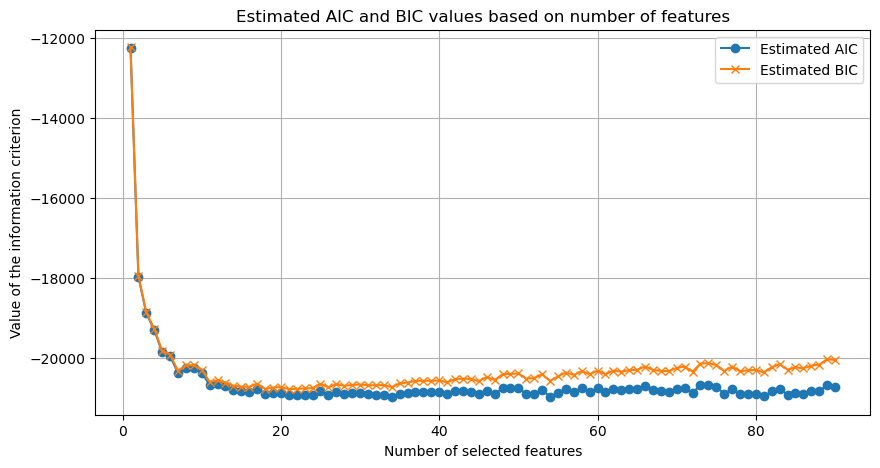

In [38]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
import matplotlib.pyplot as plt


# Initializing lists to store AIC and BIC values
aic_values = []
bic_values = []

# Calculate AIC and BIC for each number of features
for i in range(1, len(X_train.columns) + 1):
     features_subset = X_train.columns[:i]

     # Train the model on the subset
     model = XGBClassifier(n_jobs=-1, n_estimators=50, random_state=1)
     model.fit(X_train[features_subset], y_train)

     # Evaluate the model
     y_pred = model.predict(X_val[features_subset])
     accuracy = accuracy_score(y_val, y_pred)
     n = len(y_train)
     k = i # Number of features in the subset

     # Estimate AIC and BIC using precision as a surrogate for log-likelihood
     deviance = -2 * accuracy * n # Use precision as a substitute for log-likelihood
     aic_estimated = deviance + 2 * k
     bic_estimated = deviance + np.log(n) * k

     aic_values.append(aic_estimated)
     bic_values.append(bic_estimated)

# Number of features selected in each iteration
num_features = list(range(1, len(X_train.columns) + 1))

# Plot AIC and BIC values
plt.figure(figsize=(10, 5))
plt.plot(num_features, aic_values, label='Estimated AIC', marker='o')
plt.plot(num_features, bic_values, label='Estimated BIC', marker='x')
plt.xlabel('Number of selected features')
plt.ylabel('Value of the information criterion')
plt.title('Estimated AIC and BIC values based on number of features')
plt.legend()
plt.grid(True)
plt.show()

# So now we work with X_train_selected, X_val_selected only for the selected features above

In [39]:
X_train_selected, X_val_selected= X_train[selected_features], X_val[selected_features]

In [40]:
X_train_selected.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,...,igneous_and_metamorphic,Soil_type,Aspect_Sector_N,Aspect_Sector_NE,Aspect_Sector_E,Aspect_Sector_SE,Aspect_Sector_S,Aspect_Sector_SW,Aspect_Sector_W,Aspect_Sector_NW
4679,270670,2197,37,35,124,65,1082,195,142,57,...,1,10,0,1,0,0,0,0,0,0
6634,5992,2361,29,19,0,0,765,210,195,115,...,1,10,0,1,0,0,0,0,0,0
11459,231918,2737,298,30,330,178,1199,125,215,223,...,1,33,0,0,0,0,0,0,0,1
15053,226315,3364,70,32,190,24,3078,235,160,0,...,1,39,0,0,1,0,0,0,0,0
8222,277832,2318,131,27,247,121,732,251,214,73,...,1,3,0,0,0,1,0,0,0,0


------------------------------------------------------------------------------------------------------------------------------
## Part 1 : Neural Networks

1. Data Preparation for the Neural Network
- a) Data Cleaning
- b) Standardisation of the dataset
- c) How to deal with the skewness of some exploratory variables ?
- d) How to deal with the highly correlated variables ?

2. Predictinng with a MLP(with optimisation of the hyperparameters using RandomSearch)

------------------------------------------------------------------------------------------------------------------------------
#### a)Data Cleaning

In [41]:
X_train_selected = X_train_selected.copy()
X_val_selected = X_val_selected.copy()

X_train_selected.drop(columns=['Id'], inplace=True)
X_val_selected.drop(columns=['Id'], inplace=True)

X_train_selected.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,...,igneous_and_metamorphic,Soil_type,Aspect_Sector_N,Aspect_Sector_NE,Aspect_Sector_E,Aspect_Sector_SE,Aspect_Sector_S,Aspect_Sector_SW,Aspect_Sector_W,Aspect_Sector_NW
4679,2197,37,35,124,65,1082,195,142,57,1554,...,1,10,0,1,0,0,0,0,0,0
6634,2361,29,19,0,0,765,210,195,115,1116,...,1,10,0,1,0,0,0,0,0,0
11459,2737,298,30,330,178,1199,125,215,223,842,...,1,33,0,0,0,0,0,0,0,1
15053,3364,70,32,190,24,3078,235,160,0,1956,...,1,39,0,0,1,0,0,0,0,0
8222,2318,131,27,247,121,732,251,214,73,1579,...,1,3,0,0,0,1,0,0,0,0


In [42]:
#import seaborn as sns
#import matplotlib.pyplot as plt
#from tqdm import tqdm

# First, create the pairplot
#pairplot = sns.pairplot(X_train_selected, corner=True, palette='deep')


#selected_vars = X_train_selected.columns
#n = len(selected_vars)
#total_iterations = n * (n - 1) / 2  # Total pairs of variables

# Initialize tqdm
#progress_bar = tqdm(total=total_iterations, desc="Adding Correlation Coefficients")

# Loop over pairs of variables to annotate the plots with correlation coefficients
#for i in range(len(selected_vars)):
    #for j in range(i+1, len(selected_vars)):
        # Check if the plot axes exist to avoid errors
        #if pairplot.axes[j][i] is not None:
            #x = selected_vars[i]
            #y = selected_vars[j]
            #r = X_train_selected[[x, y]].corr().iloc[0, 1]
            # Annotate the plot with the correlation coefficient
            #pairplot.axes[j][i].annotate(f'r = {r:.2f}', xy=(.1, .9), xycoords='axes fraction', ha='center')
        #progress_bar.update(1)

#progress_bar.close()

# Display the pairplot
#plt.show()

------------------------------------------------------------------------------------------------------------------------------
#### b)Standardisation of the dataset : How to choose beetween the Z-score one and the MinMax one ?

- In the context of predicting forest cover types, the choice between MinMax normalization and standardization (z-score) depends on several factors, including the distribution of the data, the presence of outliers, and the type of model used.

- Standardization (z-score): Standardization transforms the data so that it has a mean of 0 and a standard deviation of 1. This method is particularly useful when the data follows an approximately normal distribution and the model is sensitive to variations in The scale between features, as is the case with neural networks and distance-based models (e.g., SVM, k-NN).

- MinMax Normalization: MinMax normalization resizes data to a specific interval, usually [0, 1] or [-1, 1]. This method is often preferred when the data does not follow a normal distribution or when the presence of outliers is minimal, because MinMax normalization is more sensitive to outliers than standardization.

This explication is taken from the below research paper:

- Pre-processing Techniques for Context Recognition from Accelerometer Data" by G. Shakhnarovich et al. (Personal and Ubiquitous Computing, 2004). It discusses the The importance of data preparation, including normalization and standardization, in signal processing for machine learning tasks. The authors emphasize that the choice between these techniques depends on the nature of the data and the objective of the application.

#### So basically we are going to see the distribution of the explanatory variables and if a majority of them is distributed in a normal way then we standardize by Z score

In [43]:
import pandas as pd
import scipy.stats as stats

X_train_selected_sample = X_train_selected.iloc[:5000, :]

results_list = []

for column in X_train_selected_sample.columns:
    stat, p_value = stats.shapiro(X_train_selected_sample[column].dropna())  
    results_list.append({
        'Feature': column,
        'Statistic': stat,
        'p-value': p_value,
        'Normal Distribution?': 'Yes' if p_value > 0.05 else 'No'
    })

# Conversion de la liste des résultats en DataFrame
normality_test_results = pd.DataFrame(results_list)

# Affichage des résultats
print(normality_test_results)


                             Feature  Statistic       p-value  \
0                          Elevation   0.965830  7.412317e-33   
1                             Aspect   0.916318  0.000000e+00   
2                              Slope   0.970919  1.071169e-30   
3   Horizontal_Distance_To_Hydrology   0.878027  0.000000e+00   
4     Vertical_Distance_To_Hydrology   0.866620  0.000000e+00   
..                               ...        ...           ...   
83                  Aspect_Sector_SE   0.421967  0.000000e+00   
84                   Aspect_Sector_S   0.321111  0.000000e+00   
85                  Aspect_Sector_SW   0.247838  0.000000e+00   
86                   Aspect_Sector_W   0.264489  0.000000e+00   
87                  Aspect_Sector_NW   0.397919  0.000000e+00   

   Normal Distribution?  
0                    No  
1                    No  
2                    No  
3                    No  
4                    No  
..                  ...  
83                   No  
84         

/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/scipy/stats/_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "


------------------------------------------------------------------------------------------------------------------------------
#### c)How to deal with the skewness of some exploratory variables in the context of neural networks ?

- The Yeo-Johnson transformation is designed to be flexible and works well for both right-skewed (positive skewness) and left-skewed (negative skewness) variables. It can be applied on data with positive, negative, or zero values, making it particularly useful in the situation of a neural network.

- The main advantage of the Yeo-Johnson transformation over other methods like logarithmic or Box-Cox transformation is its ability to handle zero and negative values without requiring prior adjustments to the data. This makes it a very practical and robust option for normalizing data before using it in machine learning models, including neural networks, where uniformity of distributions of input variables can facilitate learning and improve results. model performance.

- Informations taken from : Yeo, In-Kwon, and Richard A. Johnson. "A new family of power transformations to improve normality or symmetry." Biometrika 87.4 (2000): 954-959.


In [44]:
from scipy.stats import skew

# Function to check if a variable is skewed
def check_skewed(skewness):
    if skewness > 0.5 or skewness < -0.5:
        return "Skewed"
    else:
        return "Approximately Symmetric"

# Calculating skewness for each selected variable
skewness_results = []
for col in X_train_selected:
    skewness_value = skew(X_train_selected[col])
    skewness_results.append({
        'Variable': col,
        'Skewness': skewness_value,
        'Skewness Interpretation': check_skewed(skewness_value)
    })

# Creating a DataFrame to display the results
skewness_df = pd.DataFrame(skewness_results)
print(skewness_df)

                            Variable  Skewness  Skewness Interpretation
0                          Elevation  0.082591  Approximately Symmetric
1                             Aspect  0.456070  Approximately Symmetric
2                              Slope  0.523648                   Skewed
3   Horizontal_Distance_To_Hydrology  1.436849                   Skewed
4     Vertical_Distance_To_Hydrology  1.522852                   Skewed
..                               ...       ...                      ...
83                  Aspect_Sector_SE  1.979044                   Skewed
84                   Aspect_Sector_S  2.997599                   Skewed
85                  Aspect_Sector_SW  3.846534                   Skewed
86                   Aspect_Sector_W  3.535234                   Skewed
87                  Aspect_Sector_NW  2.207455                   Skewed

[88 rows x 3 columns]


In [45]:
from scipy.stats import yeojohnson
import numpy as np
import pandas as pd


# Retrieves variables to transform
skewed_vars = skewness_df.loc[skewness_df['Skewness Interpretation'] == 'Skewed', 'Variable']

# Dictionary to store transformation parameters
yeojohnson_params = {}

#for col in skewed_vars:
    # Apply Yeo-Johnson transformation on training data and store parameters
    #X_train_selected[col], lmbda = yeojohnson(X_train_selected[col])
    #yeojohnson_params[col] = lmbda  # Store the lambda (transformation parameter)

    # Apply the same transformation on the validation data using stored parameters
    #X_val_selected[col] = stats.yeojohnson(X_val_selected[col], lmbda=yeojohnson_params[col])

# Now X_train_selected and X_val_selected are properly transformed without information leakage


------------------------------------------------------------------------------------------------------------------------------
#### d) How to deal with the highly correlated variables ?

- Principal Component Analysis (PCA) is designed to address issues with highly correlated variables as part of a feature selection process, particularly in cases like neural network modeling. It's a valid and frequently employed method for reducing data dimensionality, especially when there's significant correlation among variables. However, there isn't always clear research evidence to suggest a consistently positive impact on the predictions of a neural network model due to PCA application. Therefore, it's practical to experiment with neural network models both with and without PCA to assess its effect on the model's performance.

- Research Article Justification:
Jolliffe, I. T., & Cadima, J. (2016). Principal component analysis: a review and recent developments. Philosophical Transactions of the Royal Society A: Mathematical, Physical and Engineering Sciences, 374(2065), 20150202.

- This article reviews PCA, highlighting its role in reducing the dimensionality of data with highly correlated variables. It underscores PCA's versatility and widespread use across various fields for feature extraction and dimensionality reduction. Although the article discusses PCA's broad applications, it also implicitly supports the notion that the direct impact of PCA on improving model predictions, such as in neural networks, can vary. Consequently, the recommendation to empirically test neural network models with and without PCA is aligned with a cautious approach to applying dimensionality reduction techniques, recognizing that their benefits may not be universal across all modeling scenarios and datasets.

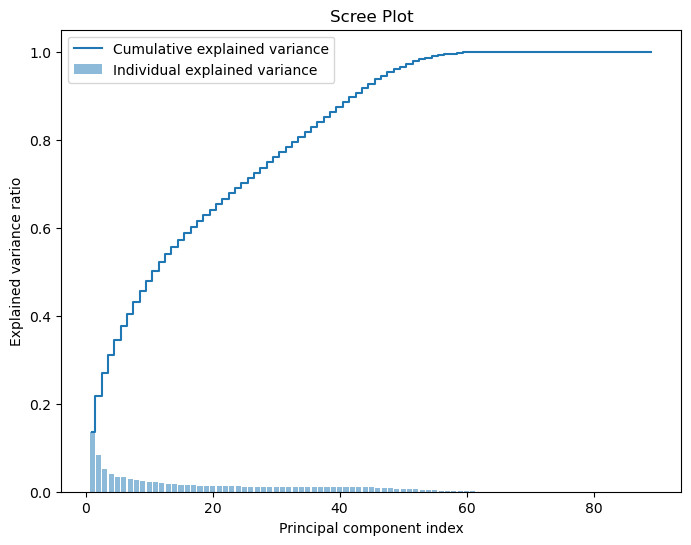

In [46]:
from sklearn.decomposition import PCA

# Applying PCA out specifying the number of components
pca = PCA()

scaler = StandardScaler()
data_standardized = scaler.fit_transform(X_train[selected_features])

principal_components = pca.fit_transform(data_standardized)

# Calculate the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Calculate the cumulative variance explained
cumulative_variance = np.cumsum(explained_variance_ratio)

# Plotting the scree plot
plt.figure(figsize=(8,6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, alpha=0.5, align='center', label='Individual explained variance')
plt.step(range(1, len(cumulative_variance) + 1), cumulative_variance, where='mid', label='Cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal component index')
plt.legend(loc='best')
plt.title('Scree Plot')
plt.show()

# Identifying the 'elbow' in the scree plot can help decide how many principal components to keep.
# This is done by looking for the point where the increase in the explained variance ratio begins to slow down significantly.


In [47]:
# Number of components to keep
n_components_to_keep = 40 # the number we decided based on the scree plot

# Fit PCA  the decided number of components
pca = PCA(n_components=n_components_to_keep)
pca.fit(data_standardized)

# Calculate the loadings (correlations) for each component
loadings = pd.DataFrame(pca.components_, columns=X[selected_features].columns)

# Identify variables  the strongest contributions (highest loadings) for the components
# Here we choose a threshold for considering a loading as significant, for example 0.5.
significant_loadings_indices = np.abs(loadings) > 0.1

# Print the variables that have significant loadings for each component
#for i in range(n_components_to_keep):
#    significant_vars = loadings.columns[significant_loadings_indices.iloc[i]]
#    print(f"Principal Component {i+1} significant variables:")
#    print(significant_vars.tolist())

In [48]:
# Initialize PCA with the desired number of components
pca = PCA(n_components=n_components_to_keep)

# Fit PCA on the standardized 'X_train_selected' dataset
pca.fit(X_train_selected)

# Transform 'X_train_selected' and 'X_val_selected' using the fitted PCA
X_train_selected_with_pca = pca.transform(X_train_selected)
X_val_selected_with_pca = pca.transform(X_val_selected)

# Convert the transformed data back to DataFrame for easier handling
column_names = [f"PC{i+1}" for i in range(n_components_to_keep)]
X_train_selected_with_pca_df = pd.DataFrame(X_train_selected_with_pca, columns=column_names)
X_val_selected_with_pca_df = pd.DataFrame(X_val_selected_with_pca, columns=column_names)

# Display the first few rows to verify
X_train_selected_with_pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40
0,-8456.264232,3706.986706,207.490307,312.794553,-409.914270,667.540493,277.115302,37.290123,92.838379,-22.480510,...,-0.106461,0.020364,0.107739,-0.016969,0.036288,0.056913,-0.155864,0.123603,-0.008938,0.006589
1,-5599.094324,896.105024,-860.970590,142.500764,-263.126600,151.117293,207.987776,-0.929929,-41.340096,-36.170601,...,-0.156544,-0.097114,0.195131,-0.046232,0.078657,-0.052522,0.005926,-0.010387,0.025808,-0.000424
2,13968.214700,5512.463261,135.138555,-63.302416,261.777376,42.086312,-27.854251,137.273278,-87.458304,10.291807,...,-0.025385,0.136191,-0.651245,0.021891,0.324949,0.094221,-0.027435,-0.390849,0.133091,-0.187605
3,-7428.440933,2290.230651,2006.647240,-510.741182,361.340598,-462.755145,15.886048,16.808233,-4.835450,157.193125,...,-0.000373,0.219666,0.202628,0.485682,-0.108120,-0.087168,0.003384,-0.165516,0.227973,-0.210748
4,-8825.111372,4124.391892,50.949683,512.459541,-179.758526,-215.930544,-257.039395,-20.843409,18.692752,-1.297758,...,0.202743,-0.340675,-0.045649,-0.006458,-0.159513,-0.031063,-0.078931,-0.169563,-0.003312,0.030921


------------------------------------------------------------------------------------------------------------------------------
#### 2)Predicting with a MLP (Spoiler the best is 0.80 for the initial cleaned dataset, no new/features variables, with PCA)

- a) With initial dataset
- b) With selected variables no PCA
- c) With selected variables and PCA
- d) With initial dataset and PCA
- e) With selected and no PCA and Yeo and Skewness



- a) With initial untouched dataset

In [50]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

df_train = pd.read_csv('datasets/train.csv')
df_train=df_train.drop(columns=['Soil_Type15', 'Soil_Type7'])

# Identify binary columns
binary_cols = [col for col in df_train.columns if 'Soil_Type' in col or 'Wilderness_Area' in col]
# Select columns to exclude (binary variables + Cover_Type)
cols_to_exclude = binary_cols

df_train = df_train.drop(columns=cols_to_exclude)

# Supposons que train_full soit votre DataFrame chargé
y = df_train['Cover_Type'] - 1  # Cible
X = df_train.drop(columns=['Cover_Type', 'Id'])  # Caractéristiques, en supposant que vous voulez supprimer 'Id'

# Initialisation du MinMaxScaler
scaler = MinMaxScaler()

# Ajustement du scaler sur les caractéristiques et transformation de X
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Division des données en ensembles d'entraînement et de validation
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

In [51]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

mlp = MLPClassifier(random_state=42, max_iter=500)

# Définir l'espace de paramètres pour RandomizedSearchCV
param_dist_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': uniform(0.0001, 0.01),
    'learning_rate_init': uniform(0.001, 0.01)
}

# Créer un objet RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(mlp, param_distributions=param_dist_mlp, n_iter=10, cv=3, verbose=3, n_jobs=-1, random_state=42)

# Adapter le modèle aux données d'entraînement
random_search_mlp.fit(X_train, y_train)

# Évaluation du meilleur modèle sur l'ensemble de validation
best_model_mlp = random_search_mlp.best_estimator_
y_pred = best_model_mlp.predict(X_val)
print("Accuracy (for validation):", accuracy_score(y_val, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 3/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.672 total time=  17.4s
[CV 1/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.732 total time=  39.5s
[CV 2/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.712 total time=  47.9s
[CV 1/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.715 total time=  55.9s
[CV 2/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.731 total time=  47.4s
[CV 3/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, s

/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/3] END activation=logistic, alpha=0.006903075385877797, hidden_layer_sizes=(50,), learning_rate_init=0.0016505159298527952;, score=0.673 total time=  51.4s


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/3] END activation=logistic, alpha=0.006903075385877797, hidden_layer_sizes=(50,), learning_rate_init=0.0016505159298527952;, score=0.670 total time=  52.0s
Accuracy (for validation): 0.8048941798941799


- b) With selected variables no PCA

In [52]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

mlp = MLPClassifier(random_state=42, max_iter=500)

# Définir l'espace de paramètres pour RandomizedSearchCV
param_dist_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': uniform(0.0001, 0.01),  # Utilisez 'uniform' pour une distribution continue
    'learning_rate_init': uniform(0.001, 0.01)
}

# Créer un objet RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(mlp, param_distributions=param_dist_mlp, n_iter=10, cv=3, verbose=3, n_jobs=-1, random_state=42)

# Adapter le modèle aux données d'entraînement
random_search_mlp.fit(X_train_selected, y_train)

# Évaluation du meilleur modèle sur l'ensemble de validation
best_model_mlp = random_search_mlp.best_estimator_
y_pred = best_model_mlp.predict(X_val_selected)
print("Accuracy NOW WITH SELECTED FEATURES (for validation):", accuracy_score(y_val, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 2/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.244 total time=   3.1s
[CV 1/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.259 total time=   4.5s
[CV 1/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.475 total time=  13.5s
[CV 3/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.264 total time=  13.5s
[CV 2/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.545 total time=  15.3s
[CV 2/3] END activation=logistic, alpha=0.004692488919658672, hidden_layer_sizes=(50,), learning_rate_init=0.007011150117432088;,

- c) With selected variables and PCA

In [53]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

mlp = MLPClassifier(random_state=42, max_iter=500)

# Définir l'espace de paramètres pour RandomizedSearchCV
param_dist_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': uniform(0.0001, 0.01),  # Utilisez 'uniform' pour une distribution continue
    'learning_rate_init': uniform(0.001, 0.01)  # Pour l'optimiseur 'adam', ajuste le taux d'apprentissage initial
}

# Créer un objet RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(mlp, param_distributions=param_dist_mlp, n_iter=10, cv=3, verbose=3, n_jobs=-1, random_state=42)

# Adapter le modèle aux données d'entraînement
random_search_mlp.fit(X_train_selected_with_pca, y_train)  # Assurez-vous que X_train et y_train sont bien définis

# Évaluation du meilleur modèle sur l'ensemble de validation
best_model_mlp = random_search_mlp.best_estimator_
y_pred = best_model_mlp.predict(X_val_selected_with_pca)
print("Accuracy NOW WITH SELECTED FEATURES AND PCA (for validation):", accuracy_score(y_val, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 1/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.567 total time=   5.6s
[CV 1/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.585 total time=   9.6s
[CV 2/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.587 total time=   4.0s
[CV 2/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.588 total time=   9.7s
[CV 3/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.584 total time=  12.9s
[CV 3/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, s

- d) With initial dataset and PCA

In [54]:
# Initialize PCA with the desired number of components
pca = PCA(n_components=10)

# Fit PCA on the standardized 'X_train_selected' dataset
pca.fit(X_train)

X_train_with_pca = pca.transform(X_train)
X_val_with_pca = pca.transform(X_val)

# Convert the transformed data back to DataFrame for easier handling
column_names = [f"PC{i+1}" for i in range(10)]
X_train_with_pca = pd.DataFrame(X_train_with_pca, columns=column_names)
X_val_with_pca = pd.DataFrame(X_val_with_pca, columns=column_names)

# Display the first few rows to verify
X_train_with_pca.head()

from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

mlp = MLPClassifier(random_state=42, max_iter=500)

# Définir l'espace de paramètres pour RandomizedSearchCV
param_dist_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': uniform(0.0001, 0.01),  # Utilisez 'uniform' pour une distribution continue
    'learning_rate_init': uniform(0.001, 0.01)  # Pour l'optimiseur 'adam', ajuste le taux d'apprentissage initial
}

# Créer un objet RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(mlp, param_distributions=param_dist_mlp, n_iter=10, cv=3, verbose=3, n_jobs=-1, random_state=42)

# Adapter le modèle aux données d'entraînement
random_search_mlp.fit(X_train_with_pca, y_train)  # Assurez-vous que X_train et y_train sont bien définis

# Évaluation du meilleur modèle sur l'ensemble de validation
best_model_mlp = random_search_mlp.best_estimator_
y_pred = best_model_mlp.predict(X_val_with_pca)
print("Accuracy NOW WITH ONLY PCA (for validation):", accuracy_score(y_val, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 1/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.728 total time=  34.3s
[CV 2/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.726 total time=  34.3s
[CV 3/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.723 total time=  35.1s
[CV 1/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.752 total time=  43.6s
[CV 3/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.744 total time=  27.2s
[CV 1/3] END activation=logistic, alpha=0.004692488919658672, hidden_layer_sizes=(50,), learning_rate_init=0.007011150117432088;,

/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/3] END activation=relu, alpha=0.0031424224295953773, hidden_layer_sizes=(100,), learning_rate_init=0.001070663052197174;, score=0.746 total time= 1.0min
[CV 3/3] END activation=tanh, alpha=0.0022233911067827614, hidden_layer_sizes=(100, 100), learning_rate_init=0.010922115592912174;, score=0.773 total time= 1.7min
[CV 2/3] END activation=tanh, alpha=0.0022233911067827614, hidden_layer_sizes=(100, 100), learning_rate_init=0.010922115592912174;, score=0.767 total time= 2.1min
[CV 1/3] END activation=relu, alpha=0.003012291401980419, hidden_layer_sizes=(50, 50), learning_rate_init=0.004998609717152555;, score=0.757 total time=  24.3s


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/3] END activation=relu, alpha=0.0031424224295953773, hidden_layer_sizes=(100,), learning_rate_init=0.001070663052197174;, score=0.742 total time= 1.2min


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/3] END activation=relu, alpha=0.0031424224295953773, hidden_layer_sizes=(100,), learning_rate_init=0.001070663052197174;, score=0.746 total time= 1.2min
[CV 2/3] END activation=relu, alpha=0.003012291401980419, hidden_layer_sizes=(50, 50), learning_rate_init=0.004998609717152555;, score=0.765 total time=  41.1s
[CV 3/3] END activation=relu, alpha=0.003012291401980419, hidden_layer_sizes=(50, 50), learning_rate_init=0.004998609717152555;, score=0.758 total time=  38.4s
[CV 1/3] END activation=logistic, alpha=0.004660699842170359, hidden_layer_sizes=(50, 50), learning_rate_init=0.007183860093330873;, score=0.734 total time=  35.1s
[CV 2/3] END activation=logistic, alpha=0.004660699842170359, hidden_layer_sizes=(50, 50), learning_rate_init=0.007183860093330873;, score=0.742 total time= 1.3min
[CV 3/3] END activation=logistic, alpha=0.004660699842170359, hidden_layer_sizes=(50, 50), learning_rate_init=0.007183860093330873;, score=0.745 total time= 1.5min
[CV 1/3] END activation=logis

/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/3] END activation=logistic, alpha=0.009932308858067881, hidden_layer_sizes=(50,), learning_rate_init=0.0014645041271999773;, score=0.672 total time= 1.8min


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/3] END activation=logistic, alpha=0.009932308858067881, hidden_layer_sizes=(50,), learning_rate_init=0.0014645041271999773;, score=0.673 total time= 1.3min


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 1/3] END activation=logistic, alpha=0.006903075385877797, hidden_layer_sizes=(50,), learning_rate_init=0.0016505159298527952;, score=0.680 total time=  53.6s


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 2/3] END activation=logistic, alpha=0.006903075385877797, hidden_layer_sizes=(50,), learning_rate_init=0.0016505159298527952;, score=0.681 total time=  48.4s


/Users/mohamedbenslimane/miniconda3/envs/ydata_profile/lib/python3.10/site-packages/sklearn/neural_network/_multilayer_perceptron.py:691: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (500) reached and the optimization hasn't converged yet.
  warnings.warn(


[CV 3/3] END activation=logistic, alpha=0.006903075385877797, hidden_layer_sizes=(50,), learning_rate_init=0.0016505159298527952;, score=0.678 total time=  46.8s
Accuracy NOW WITH ONLY PCA (for validation): 0.8052248677248677


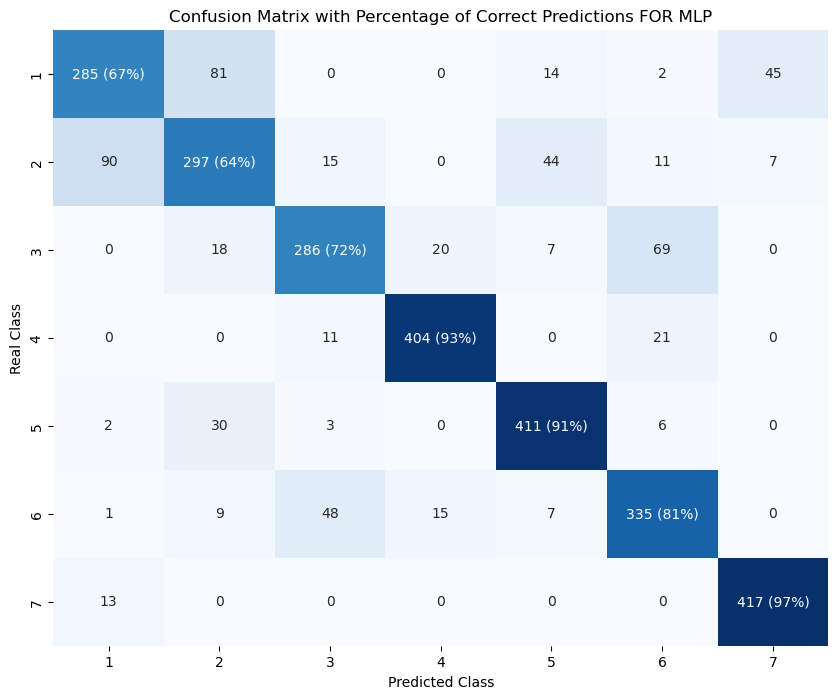

In [55]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

# Calculate the confusion matrix
cm = confusion_matrix(y_val, y_pred)

# Calculate the percentage of diagonal elements
cm_diagonal_percentage = np.diagonal(cm) / cm.sum(axis=1) * 100

# Create an annotated matrix to display percentages on the diagonal
cm_annotated = np.array(cm, dtype=object) # Create an array of objects to allow mixed types

# Replace diagonal elements with strings showing both counts and percentages
for i in range(len(cm)):
     cm_annotated[i, i] = f"{cm[i, i]} ({cm_diagonal_percentage[i]:.0f}%)"

# Define class labels as 1 to 7 instead of 0 to 6
class_labels = [str(i) for i in range(1, 8)]

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=cm_annotated, fmt='', cmap='Blues', xticklabels=class_labels, yticklabels=class_labels, cbar=False)
plt.title('Confusion Matrix with Percentage of Correct Predictions FOR MLP')
plt.xlabel('Predicted Class')
plt.ylabel('Real Class')
plt.show()

- e) With selected and no PCA and Yeo and Skewness

In [56]:
y = train_scoring['Cover_Type'] - 1
X = train_scoring.drop(columns=['Cover_Type'])

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

X_train_selected, X_val_selected= X_train[selected_features], X_val[selected_features]

In [57]:
from sklearn.neural_network import MLPClassifier
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint as sp_randint
from scipy.stats import uniform

mlp = MLPClassifier(random_state=42, max_iter=500)

# Définir l'espace de paramètres pour RandomizedSearchCV
param_dist_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 100)],
    'activation': ['relu', 'tanh', 'logistic'],
    'alpha': uniform(0.0001, 0.01),  # Utilisez 'uniform' pour une distribution continue
    'learning_rate_init': uniform(0.001, 0.01)  # Pour l'optimiseur 'adam', ajuste le taux d'apprentissage initial
}

# Créer un objet RandomizedSearchCV
random_search_mlp = RandomizedSearchCV(mlp, param_distributions=param_dist_mlp, n_iter=10, cv=3, verbose=3, n_jobs=-1, random_state=42)

# Adapter le modèle aux données d'entraînement
random_search_mlp.fit(X_train_selected, y_train)  # Assurez-vous que X_train et y_train sont bien définis

# Évaluation du meilleur modèle sur l'ensemble de validation
best_model_mlp = random_search_mlp.best_estimator_
y_pred = best_model_mlp.predict(X_val_selected)
print("Accuracy NOW WITH SELECTED FEATURES AND NO PCA AND YEO +SKEW (for validation):", accuracy_score(y_val, y_pred))


Fitting 3 folds for each of 10 candidates, totalling 30 fits
[CV 3/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.252 total time=   4.3s
[CV 2/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.248 total time=   4.6s
[CV 1/3] END activation=relu, alpha=0.006068501579464871, hidden_layer_sizes=(100,), learning_rate_init=0.0025599452033620265;, score=0.417 total time=   8.5s
[CV 1/3] END activation=logistic, alpha=0.008065429868602328, hidden_layer_sizes=(50, 50), learning_rate_init=0.008319939418114052;, score=0.240 total time=  14.0s
[CV 1/3] END activation=logistic, alpha=0.004692488919658672, hidden_layer_sizes=(50,), learning_rate_init=0.007011150117432088;, score=0.253 total time=   5.7s
[CV 3/3] END activation=logistic, alpha=0.004692488919658672, hidden_layer_sizes=(50,), learning_rate_init=0.007011150117432088

------------------------------------------------------------------------------------------------------------------------------
#### 2)Predicting with Naive Bayes (Spoiler: best model gives 0.58 as validation accuracy using the data new featured selected varaibles  with Chi-Squared Test)



1. Dataset with PCA only:

In [58]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

# Standardizing the dataset
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_val_scaled = scaler.transform(X_val)

# Initialize PCA with the desired number of components
pca = PCA(n_components=10)

# Fit PCA on the standardized 'X_train' dataset and transform both 'X_train' and 'X_val'
X_train_with_pca = pca.fit_transform(X_train_scaled)
X_val_with_pca = pca.transform(X_val_scaled)


2. Dataset with Selected Variables and PCA:

In [59]:
# Initialize PCA with the desired number of components
pca = PCA(n_components=n_components_to_keep)

# Fit PCA on the standardized 'X_train_selected' dataset
pca.fit(X_train_selected)

# Transform 'X_train_selected' and 'X_val_selected' using the fitted PCA
X_train_selected_with_pca = pca.transform(X_train_selected)
X_val_selected_with_pca = pca.transform(X_val_selected)

# Convert the transformed data back to DataFrame for easier handling
column_names = [f"PC{i+1}" for i in range(n_components_to_keep)]
X_train_selected_with_pca_df = pd.DataFrame(X_train_selected_with_pca, columns=column_names)
X_val_selected_with_pca_df = pd.DataFrame(X_val_selected_with_pca, columns=column_names)

# Display the first few rows to verify
X_train_selected_with_pca_df.head()

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC31,PC32,PC33,PC34,PC35,PC36,PC37,PC38,PC39,PC40
0,3296.210392,-8465.810398,3712.504874,204.340021,315.032909,-453.290935,656.679178,271.470084,38.497780,95.730408,...,-0.044987,-0.098735,0.021169,0.107484,-0.016351,0.011720,0.075267,-0.165260,-0.105268,-0.008254
1,-261368.166588,-4592.706033,847.248981,-823.616949,82.548844,-61.948759,146.423538,234.912005,-5.972636,-45.621592,...,0.130247,-0.154392,-0.109754,0.219184,-0.049518,0.144508,0.061382,0.038469,-0.022983,0.001761
2,-35368.942505,14106.955133,5497.161143,144.467262,-76.324173,322.245267,44.869811,-1.884437,134.151379,-91.173458,...,-0.058772,-0.104250,0.097549,-0.657610,0.032653,0.259555,0.263594,0.063176,0.355236,0.122467
3,-41053.107298,-7271.107168,2287.131587,2008.396619,-513.548752,392.052621,-461.081645,26.094451,13.689225,-11.287908,...,-0.326772,-0.130606,0.206319,0.214168,0.479465,-0.042153,-0.098321,0.022084,0.165935,0.228391
4,10456.718365,-8862.097669,4131.595626,46.366424,518.564003,-200.929938,-209.181567,-278.736611,-16.923452,21.603424,...,0.080322,0.249152,-0.324377,-0.038596,-0.009753,-0.138232,-0.108761,-0.079294,0.202440,0.013697


3. Raw Dataset (Brute):

In [61]:
df_train = pd.read_csv('datasets/train.csv')
df_train=df_train.drop(columns=['Soil_Type15', 'Soil_Type7'])

# Identify binary columns
binary_cols = [col for col in df_train.columns if 'Soil_Type' in col or 'Wilderness_Area' in col]
# Select columns to exclude (binary variables + Cover_Type)
cols_to_exclude = binary_cols

df_train = df_train.drop(columns=cols_to_exclude)

# Supposons que train_full soit votre DataFrame chargé
y = df_train['Cover_Type'] - 1  # Cible
X = df_train.drop(columns=['Cover_Type', 'Id'])  # Caractéristiques, en supposant que vous voulez supprimer 'Id'

# Initialisation du MinMaxScaler
scaler = MinMaxScaler()

# Ajustement du scaler sur les caractéristiques et transformation de X
X_scaled = pd.DataFrame(scaler.fit_transform(X), columns=X.columns)

# Division des données en ensembles d'entraînement et de validation
X_train, X_val, y_train, y_val = train_test_split(X_scaled, y, test_size=0.2, random_state=42)

4. Dataset with Feature Selection using Chi-Squared Test:

In [62]:
from sklearn.feature_selection import SelectKBest, chi2

# Shift the training data to be non-negative
min_val = abs(X_train_selected.min().min()) + 1
X_train_shifted = X_train_selected + min_val

# If you have a validation set (X_val_selected) that needs to be processed similarly
X_val_shifted = X_val_selected + min_val

# Apply SelectKBest with chi2 on the shifted training data
chi_selector = SelectKBest(chi2, k=8)  # Adjust 'k' as needed
X_train_kbest = chi_selector.fit_transform(X_train_shifted, y_train)
X_val_kbest = chi_selector.transform(X_val_shifted)


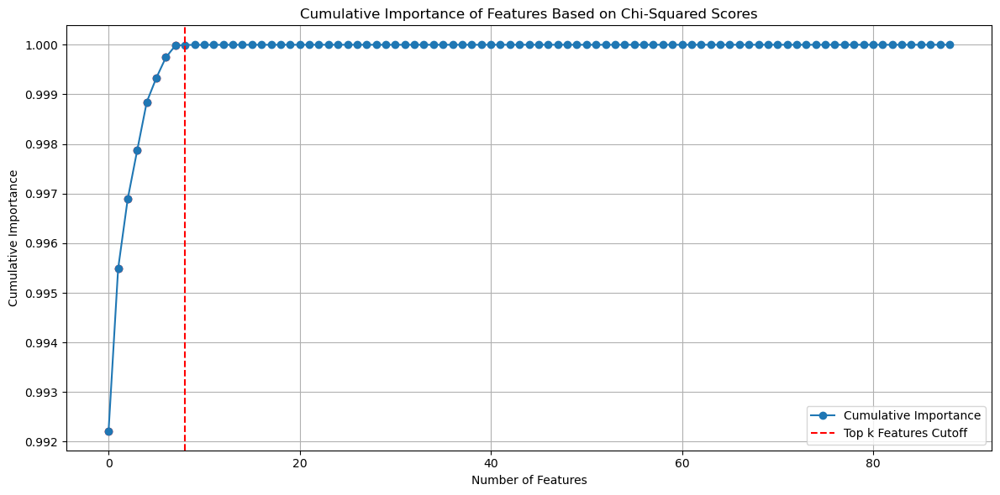

In [63]:
import matplotlib.pyplot as plt
import numpy as np

# Get the scores and sort them in descending order
chi_scores = chi_selector.scores_
indices = np.argsort(chi_scores)[::-1]

# Calculate the cumulative sum of chi-squared scores
chi_scores_cumsum = np.cumsum(chi_scores[indices])
chi_scores_cumsum_normalized = chi_scores_cumsum / chi_scores_cumsum[-1]  # normalize to 1

# Plotting
plt.figure(figsize=(12, 6))
plt.plot(range(len(chi_scores)), chi_scores_cumsum_normalized, marker='o')

# Draw a line for the cutoff at k features
k = 8  # number of features to select
plt.axvline(x=k, color='r', linestyle='--')

# Highlight the selected features in the cumulative sum line
plt.scatter(range(k), chi_scores_cumsum_normalized[:k], color='red')

# Annotations and labels
plt.title('Cumulative Importance of Features Based on Chi-Squared Scores')
plt.xlabel('Number of Features')
plt.ylabel('Cumulative Importance')
plt.legend(['Cumulative Importance', 'Top k Features Cutoff'])
plt.grid(True)
plt.tight_layout()
plt.show()


5. Dataset with Automatic Identification and Discretization of Continuous Variables:


In [64]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import KBinsDiscretizer

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

# This assumes a definition for continuous columns based on unique values
continuous_columns = [col for col in X_train.columns if X_train[col].nunique() > 10]

# Discretizing continuous variables separately for X_train and X_val
discretizer = KBinsDiscretizer(n_bins=4, encode='ordinal', strategy='quantile')

# It's crucial to fit the discretizer only on the training data to prevent data leakage
X_train[continuous_columns] = discretizer.fit_transform(X_train[continuous_columns])

X_val[continuous_columns] = discretizer.transform(X_val[continuous_columns])



Step 2: Apply Gaussian Naive Bayes to Each Dataset

In [65]:
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score, classification_report
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
import numpy as np

def train_evaluate_tune_gnb(X_train, X_val, y_train, y_val):
    gnb = GaussianNB()
    param_dist = {'var_smoothing': np.logspace(0, -9, num=100)}
    # Using StratifiedKFold for cross-validation
    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
    random_search = RandomizedSearchCV(estimator=gnb, param_distributions=param_dist, n_iter=10, cv=cv, verbose=1, random_state=42)
    random_search.fit(X_train, y_train)
    y_pred = random_search.best_estimator_.predict(X_val)
    accuracy = accuracy_score(y_val, y_pred)
    print(f"Best Model Parameters: {random_search.best_params_}")
    print(f"Accuracy for the validation set: {accuracy:.4f}")
    print(classification_report(y_val, y_pred))  # Additional evaluation metrics

datasets = {
    "PCA Only": (X_train_with_pca, X_val_with_pca),
    "Selected Features & PCA": (X_train_selected_with_pca_df, X_val_selected_with_pca_df),
    "Raw Dataset": (X_train, X_val),  # Adjusted to use X_train and X_val directly
    "Feature Selection with Chi-Squared Test": (X_train_kbest, X_val_kbest),
    "Discretized Variables": (X_train[continuous_columns],X_val[continuous_columns] )  # Assuming X_train_disc and X_val_disc are discretized
}

# Assuming y_train and y_val are correctly defined
for name, (X_train_dataset, X_val_dataset) in datasets.items():
    print(f"\nApplying to Dataset: {name}")
    train_evaluate_tune_gnb(X_train_dataset, X_val_dataset, y_train, y_val)



Applying to Dataset: PCA Only
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Model Parameters: {'var_smoothing': 1.0}
Accuracy for the validation set: 0.5503
              precision    recall  f1-score   support

           0       0.54      0.27      0.36       427
           1       0.56      0.34      0.42       464
           2       0.41      0.49      0.45       400
           3       0.78      0.69      0.73       436
           4       0.48      0.63      0.55       452
           5       0.48      0.55      0.51       415
           6       0.64      0.89      0.75       430

    accuracy                           0.55      3024
   macro avg       0.56      0.55      0.54      3024
weighted avg       0.56      0.55      0.54      3024


Applying to Dataset: Selected Features & PCA
Fitting 5 folds for each of 10 candidates, totalling 50 fits
Best Model Parameters: {'var_smoothing': 5.336699231206302e-08}
Accuracy for the validation set: 0.5440
              